In [51]:
import numpy as np
import matplotlib.pyplot as plt
from qutip import coherent, wigner, qeye, Qobj, displace, basis
from qutip.matplotlib_utilities import wigner_cmap

def wigner_plot(state, theta):
    rho = state * state.diag()
    
    # Define a grid of x and p values for plotting
    xvec = np.linspace(-5, 5, 100)
    pvec = np.linspace(-5, 5, 100)
    
    # Calculate the Wigner function
    W = wigner(rho, xvec, pvec)
    wmap = wigner_cmap(W)
    
    # Plot the Wigner function
    fig, ax = plt.subplots(figsize=(6, 6))
    cont = ax.contourf(xvec, pvec, W, 100, cmap=wmap)
    ax.set_title(f"$\\theta = {theta}^\\circ$")  # LaTeX-style title with f-string
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")
    fig.colorbar(cont, ax=ax)
    plt.show()

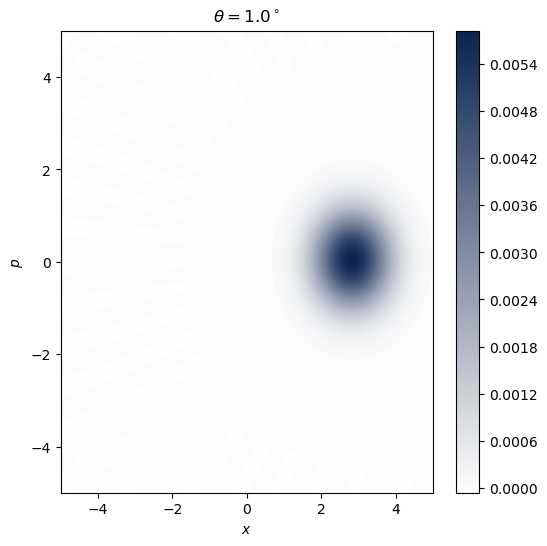

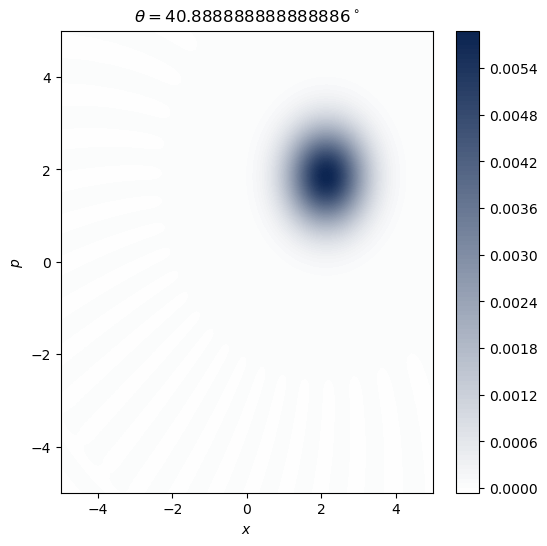

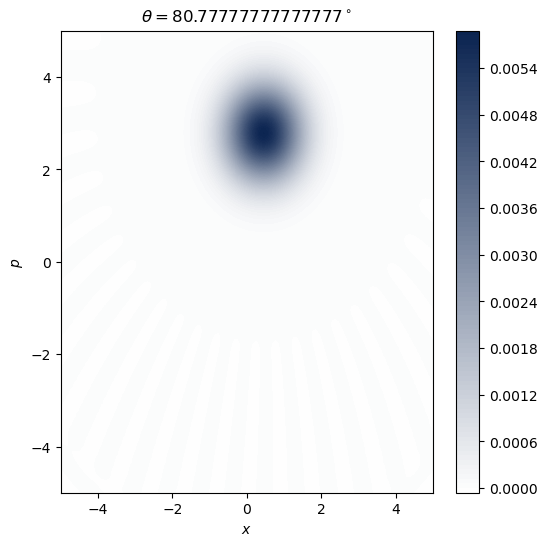

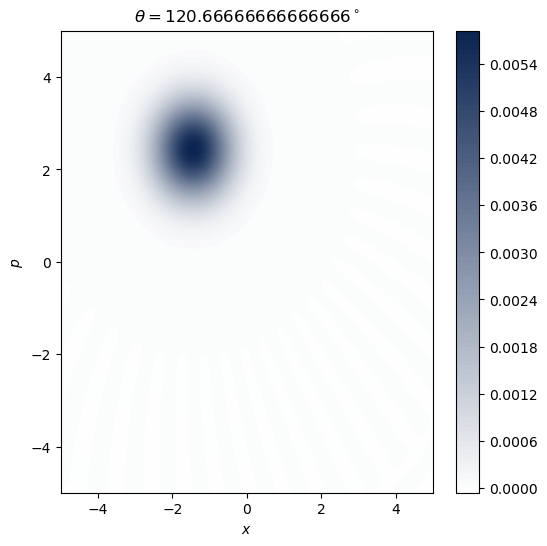

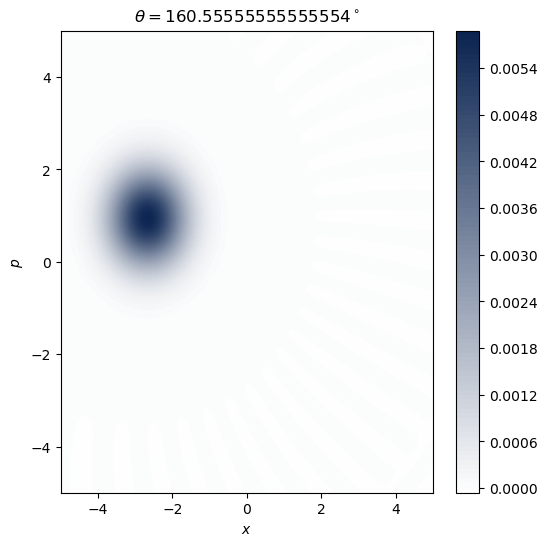

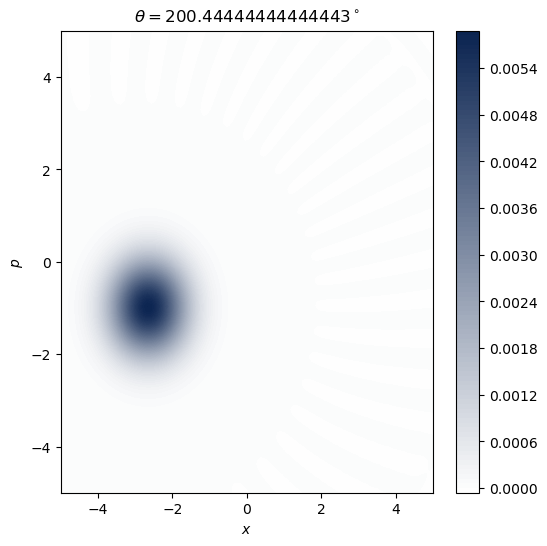

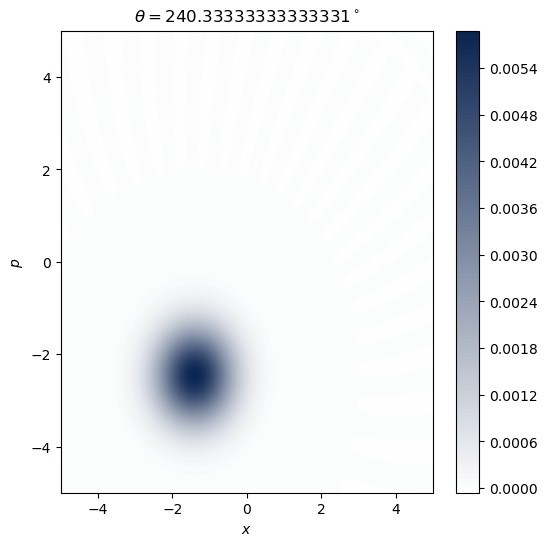

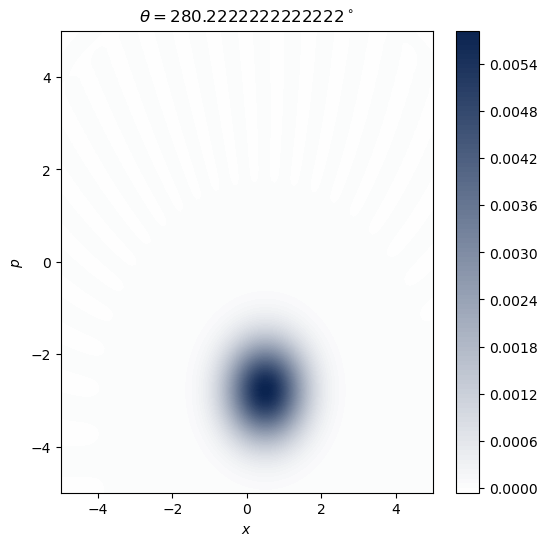

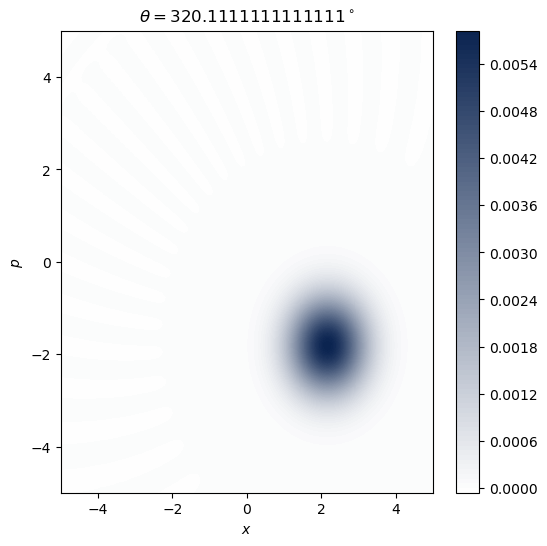

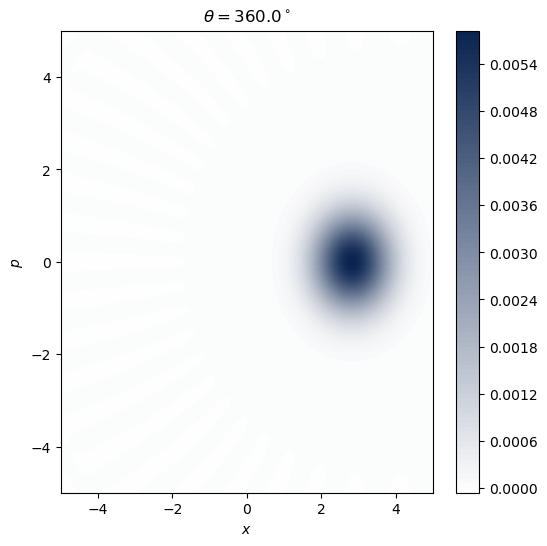

In [50]:
from math import cos, sin, pi

displaced_ground_state = lambda alpha, N: displace(N, alpha) * basis(N, 0)

thetas = np.linspace(1,360,10)
alphas = 2 * np.exp(thetas  / 180 * np.pi * 1j)
for theta, alpha in zip(thetas,alphas):
    wigner_plot(displaced_ground_state(alpha, 30), theta)

/var/tmp/pbs.9457554.venus01/ipykernel_455970/325862872.py:45: UserWarning: frames=<zip object at 0x2b211adb2240> which we can infer the length of, did not pass an explicit *save_count* and passed cache_frame_data=True.  To avoid a possibly unbounded cache, frame data caching has been disabled. To suppress this warning either pass `cache_frame_data=False` or `save_count=MAX_FRAMES`.
  anim = FuncAnimation(fig, update, frames=frames, blit=False, interval=100)
Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x2b211b64fc40>
Traceback (most recent call last):
  File "/home/svu/e0735464/.conda/miniconda/4.9/envs/fyp/lib/python3.12/site-packages/matplotlib/transforms.py", line 198, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id_self: pop(k))

KeyboardInterrupt: 

KeyboardInterrupt



Error in callback <function _draw_all_if_interactive at 0x2b210c154fe0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

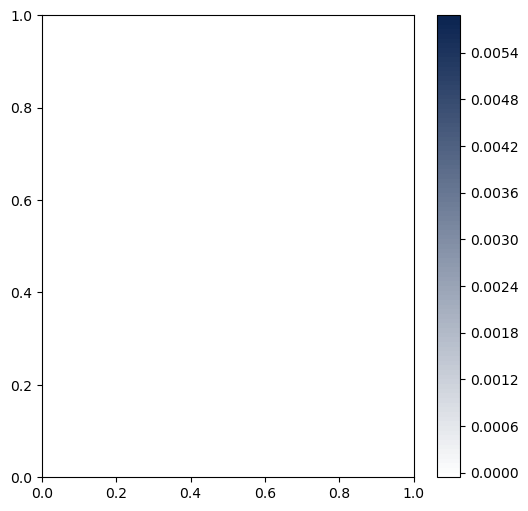

In [54]:
from matplotlib.animation import FuncAnimation

# Parameters
N = 30  # Dimension of Hilbert space
thetas = np.linspace(1,360,360)
alphas = 2 * np.exp(thetas  / 180 * np.pi * 1j)
states = [displaced_ground_state(alpha, N) for alpha in alphas]
frames = zip(thetas, states)
xvec = np.linspace(-5, 5, 500)  # Grid for plotting
pvec = np.linspace(-5, 5, 500)

# Set up the plot
def initialize_plot(initial_frame):
    # Initialize the contour plot with the first frame
    theta, state = initial_frame
    rho = state * state.diag()  # Assuming this is how the density matrix is computed
    W = wigner(rho, xvec, pvec)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim([-5, 5])
    ax.set_ylim([-5, 5])
    ax.set_title(f"$\\theta = {theta}^\\circ$")  # LaTeX-style title with f-string
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")
    cax = ax.contourf(xvec, pvec, W, 100, cmap=wigner_cmap(W))  # Placeholder cmap
    fig.colorbar(cax, ax=ax)
    return fig, ax, cax

# Function to update the plot
def update(frame):
    ax.clear()
    theta, state = frame
    rho = state * state.diag() 
    W = wigner(rho, xvec, pvec)
    cont = ax.contourf(xvec, pvec, W, 100, cmap=wigner_cmap(W))
    ax.set_title(f"$\\theta = {theta}^\\circ$")  # LaTeX-style title with f-string
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")
    ax.set_xlim([-5, 5])
    ax.set_ylim([-5, 5])
    return cont

# Create the animation
fig, ax, cax = initialize_plot(next(frames))
anim = FuncAnimation(fig, update, frames=frames, blit=False, interval=100)

from IPython.display import HTML
HTML(anim.to_jshtml())

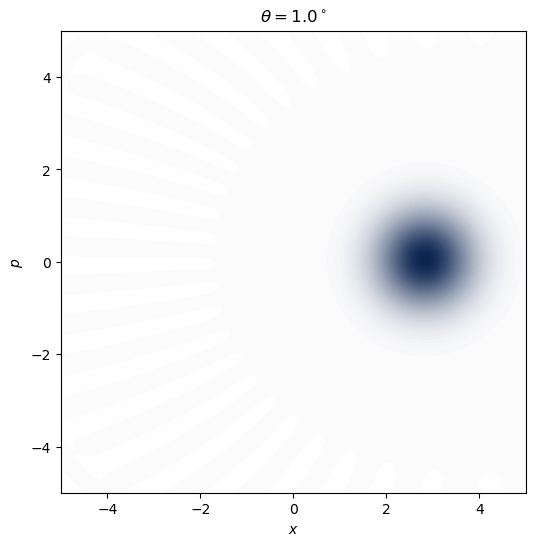

In [56]:
# Parameters
N = 30  # Dimension of Hilbert space
thetas = np.linspace(1, 360, 360)
alphas = 2 * np.exp(thetas / 180 * np.pi * 1j)
states = [displaced_ground_state(alpha, N) for alpha in alphas]
xvec = np.linspace(-5, 5, 500)  # Grid for plotting
pvec = np.linspace(-5, 5, 500)

# Set up the plot
def init_plot():
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim([-5, 5])
    ax.set_ylim([-5, 5])
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")
    theta = thetas[0]
    state = states[0]
    rho = state * state.dag()  # Density matrix
    W = wigner(rho, xvec, pvec)
    contour = ax.contourf(xvec, pvec, W, 100, cmap=wigner_cmap(W))
    cbar = fig.colorbar(contour, ax=ax)
    return fig, ax

def update(i):
    theta = thetas[i]
    state = states[i]
    rho = state * state.dag()  # Density matrix
    W = wigner(rho, xvec, pvec)
    
    ax.clear()
    ax.contourf(xvec, pvec, W, 100, cmap=wigner_cmap(W))
    ax.set_title(f"$\\theta = {theta}^\\circ$")
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")
    fig.colorbar(cax, ax=ax)


# Create the animation
fig, ax = init_plot()
anim = FuncAnimation(fig, update, frames=len(thetas), blit=False, interval=100)

# Display the animation
from IPython.display import HTML
HTML(anim.to_jshtml())

In [58]:
# Save the animation as an MP4 file
# anim.save('wigner_animation.mp4', writer='ffmpeg', fps=30)

# Save the animation as a GIF file
anim.save('wigner_animation.gif', writer='imagemagick', fps=30)

MovieWriter imagemagick unavailable; using Pillow instead.


In [ ]:
# Parameters
N = 30  # Dimension of Hilbert space
thetas = np.linspace(1, 360, 360)
alphas = 2 * np.exp(thetas / 180 * np.pi * 1j)
states = [displaced_ground_state(alpha, N) for alpha in alphas]
xvec = np.linspace(-5, 5, 500)  # Grid for plotting
pvec = np.linspace(-5, 5, 500)

# Set up the plot
def init_plot():
    fig, ax = plt.subplots(figsize=(6, 6))
    ax.set_xlim([-5, 5])
    ax.set_ylim([-5, 5])
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")
    theta = thetas[0]
    state = states[0]
    rho = state * state.dag()  # Density matrix
    W = wigner(rho, xvec, pvec)
    contour = ax.contourf(xvec, pvec, W, 100, cmap=wigner_cmap(W))
    cbar = fig.colorbar(contour, ax=ax)
    return fig, ax

def update(i):
    theta = thetas[i]
    state = states[i]
    rho = state * state.dag()  # Density matrix
    W = wigner(rho, xvec, pvec)
    
    ax.clear()
    cax = ax.contourf(xvec, pvec, W, 100, cmap=wigner_cmap(W))  # Placeholder cmap
    ax.set_title(f"$\\theta = {theta}^\\circ$")
    ax.set_xlabel("$x$")
    ax.set_ylabel("$p$")


# Create the animation
fig, ax = init_plot()
anim = FuncAnimation(fig, update, frames=len(thetas), blit=False, interval=100)

# Display the animation
from IPython.display import HTML
HTML(anim.to_jshtml())